# 00. Homework description

For this assignment, your task is to develop the [FastPitch](https://arxiv.org/abs/2006.06873) synthesis model, train it, and generate several audio samples.

The training and data processing code has already been provided for you. The training will be conducted on the LJspeech dataset.

The total score for the homework is **10 points**, distributed as follows:
- 1 point for visualizing the input data
- 8 points for writing the model code and running training
- 1 point for pitch and duration manipulations during inference

The homework submission **should include**:
- Completed notebook
- Attached WER and loss graphs from TensorBoard
- 1 audio file - the result of a regular model inference
- 4 additional audio files: you are encouraged to experiment with adjusting phoneme durations and pitch slightly and listen to the results.

# 01. Preparation steps

In [31]:
device = "cuda"
gpu_avaiable = "0"    # Run nvidia-smi to find free GPU
!nvidia-smi

Mon Jun 29 12:12:27 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   46C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os
path_to_sources = os.path.dirname(os.getcwd()) # i am in collab now

In [7]:
# If running in colab

# clone the repository:
!git clone https://github.com/yandexdataschool/speech_course.git
!pip install -r speech_course/week_08_tts_am_vocoders/requirements.txt


Cloning into 'speech_course'...
remote: Enumerating objects: 1205, done.
remote: Counting objects: 100% (352/352), done.
remote: Compressing objects: 100% (233/233), done.
remote: Total 1205 (delta 154), reused 135 (delta 119), pack-reused 853 (from 2)
Receiving objects: 100% (1205/1205), 254.80 MiB | 14.18 MiB/s, done.
Resolving deltas: 100% (511/511), done.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.7/10.7 MB 101.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.5/87.5 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 69.7 MB/s eta 0:00:00


### Dataset

We will work with [LJSpeech](https://keithito.com/LJ-Speech-Dataset/) -- a single-speaker dataset with 24 hours of speech.

The data we will use contains pre-computed [MFA-alignments](https://montreal-forced-aligner.readthedocs.io/en/latest/user_guide/workflows/alignment.html) alongside with the original wavs and texts. If you are interested in the process of extracting such alignments, please refer to this [tutorial](https://colab.research.google.com/gist/NTT123/12264d15afad861cb897f7a20a01762e/mfa-ljspeech.ipynb).

Download the dataset with precomputed alignments.

In [8]:
import requests
from urllib.parse import urlencode
from io import BytesIO
from zipfile import ZipFile

base_url = 'https://cloud-api.yandex.net/v1/disk/public/resources/download?'
public_key = 'https://disk.yandex.ru/d/PpgePfWcQTAbug'

# final_url = base_url + urlencode(dict(public_key=public_key))
# response = requests.get(final_url)
# download_url = response.json()['href']
# response = requests.get(download_url)

path_to_dataset = 'data/ljspeech'    # Choose any appropriate local path

# If running in Colab:
path_to_dataset = '/content/ljspeech_aligned'

# zipfile = ZipFile(BytesIO(response.content))
# zipfile.extractall(path=path_to_dataset)

### Hi-Fi GAN checkpoint


Download a pretrained Hi-Fi GAN checkpoint (to generate audio from the predicted mel-spectrograms).

In [ ]:
# !wget --content-disposition https://api.ngc.nvidia.com/v2/models/nvidia/dle/hifigan__pyt_ckpt_ds-ljs22khz/versions/21.08.0_amp/zip -O hifigan_ckpt.zip
# !unzip hifigan_ckpt.zip
# !rm hifigan_ckpt.zip

In [4]:
# In colab:
!wget --content-disposition https://api.ngc.nvidia.com/v2/models/nvidia/dle/hifigan__pyt_ckpt_ds-ljs22khz/versions/21.08.0_amp/zip -O /content/hifigan_ckpt.zip
!unzip /content/hifigan_ckpt.zip
!rm /content/hifigan_ckpt.zip

--2026-06-29 11:28:47--  https://api.ngc.nvidia.com/v2/models/nvidia/dle/hifigan__pyt_ckpt_ds-ljs22khz/versions/21.08.0_amp/zip
Resolving api.ngc.nvidia.com (api.ngc.nvidia.com)... 52.12.70.9, 184.34.83.28
Connecting to api.ngc.nvidia.com (api.ngc.nvidia.com)|52.12.70.9|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://xfiles.ngc.nvidia.com/org/nvidia/team/dle/models/hifigan__pyt_ckpt_ds-ljs22khz/versions/21.08.0_amp/files.zip?ssec-algo=AES256&versionId=9Z5wUkSi5Ca0OVT_KuDtXvkMxim8mDiL&ssec-key=mCx8p1I0xsmT%2Be%2Bu2JHyp5B4FUFs19CP7krE6DrTwkGxq%2FICUxjcbokIBlxq%2Bgweh5%2BGPnbyuVNKj4bHMaASZCk16BSbwNoYKdi8EfpOfOV5%2FGc7IpgG1Zaw6%2BcAMcF6IEjPoiCTnbsl4oM2HeeU13yRbVReT7x1XCjasEaI39hon7%2Bw5aDfUcJrl8II8NlDmC3lrltVxPNjkIpnAHP2OhRqldqP9HschN7bbmlaNkvlNhsn%2BMcpqycxLZ81Y7xu5eOHo%2FnY8lJm08mngQqlkxHBYBG%2Bif4%2B1bAvMiaRgvFBaNxZME70s1S7trMmgjfA4qd2DPpiXmJ4qan8sSL8ICn%2BePil5fTqCfh69%2BW%2B9tcY2JbJ%2FxLADcH8SKFIAMrDt4FoLq6w8Bd6Aw8SItJd3eqB4dzUfLyJqfZLWEDaUH2B4yB

In [3]:
path_to_hfg_ckpt = "hifigan_gen_checkpoint_6500.pt"

### Imports

In [4]:
import sys
import os
import json
import dataclasses
import torch
import subprocess as sp
import matplotlib.pylab as plt
import soundfile as sf

!pip install g2p-en
from g2p_en import G2p
import IPython.display as Ipd

In [5]:
sys.path.append(path_to_sources)

# 02. See a data sample (1 point)

In [6]:
from content.speech_course.week_08_tts_am_vocoders.sources.fastpitch.hparams import HParamsFastpitch
from content.speech_course.week_08_tts_am_vocoders.sources.fastpitch.data import prepare_loaders

The mfa alignment provides phonemes and their durations, which we will need during training:

In [9]:
with open(os.path.join(path_to_dataset, 'mfa_aligned', 'LJ001-0001.json')) as f:
  utterance = json.load(f)

utterance

{'start': 0,
 'end': 9.655062,
 'tiers': {'words': {'type': 'interval',
   'entries': [[0.0, 0.69, 'printing'],
    [0.69, 0.82, '<eps>'],
    [0.82, 1.01, 'in'],
    [1.01, 1.15, 'the'],
    [1.15, 1.45, 'only'],
    [1.45, 1.97, 'sense'],
    [1.97, 2.14, 'with'],
    [2.14, 2.39, 'which'],
    [2.39, 2.54, 'we'],
    [2.54, 2.71, 'are'],
    [2.71, 2.89, 'at'],
    [2.89, 3.28, 'present'],
    [3.28, 4.0, 'concerned'],
    [4.0, 4.41, '<eps>'],
    [4.41, 5.01, 'differs'],
    [5.01, 5.04, '<eps>'],
    [5.04, 5.28, 'from'],
    [5.28, 5.65, 'most'],
    [5.65, 5.82, 'if'],
    [5.82, 6.1, 'not'],
    [6.1, 6.29, 'from'],
    [6.29, 6.63, 'all'],
    [6.63, 6.78, 'the'],
    [6.78, 7.09, 'arts'],
    [7.09, 7.22, 'and'],
    [7.22, 7.8, 'crafts'],
    [7.8, 8.45, 'represented'],
    [8.45, 8.66, 'in'],
    [8.66, 8.79, 'the'],
    [8.79, 9.6, 'exhibition'],
    [9.6, 9.655062, '<eps>']]},
  'phones': {'type': 'interval',
   'entries': [[0.0, 0.04, 'P'],
    [0.04, 0.07, 'R'],
    [0

Phoneme `sil` here denotes pause -- a period of silence between spoken phonemes. The phonemes are from [ARPA](https://en.wikipedia.org/wiki/ARPABET) alphabet.

In [10]:
hparams = HParamsFastpitch()
train_loader, val_loader = prepare_loaders(path_to_dataset, hparams)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


In [11]:
train_iter = iter(train_loader)
batch = next(train_iter)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


In [12]:
list(dataclasses.asdict(batch).keys())

['texts',
 'text_lengths',
 'mels',
 'mel_lengths',
 'pitches',
 'durations',
 'paces']

In [13]:
batch.mels.shape

torch.Size([10, 80, 841])

In [14]:
batch.pitches.shape

torch.Size([10, 117])

In [15]:
batch.durations.shape

torch.Size([10, 117])

## Task

**(0.5 points)** Draw a combined image showing both the mel-spectrogram and pitch for a sample from the batch. Use durations to ensure proper alignment of their shapes in the image.  
**(0.5 points)** Include phoneme labels near the time axis on the image from the previous step. (like in Figure 3 in the [paper](https://arxiv.org/pdf/2006.06873.pdf)). You may find the code from the seminar helpful.

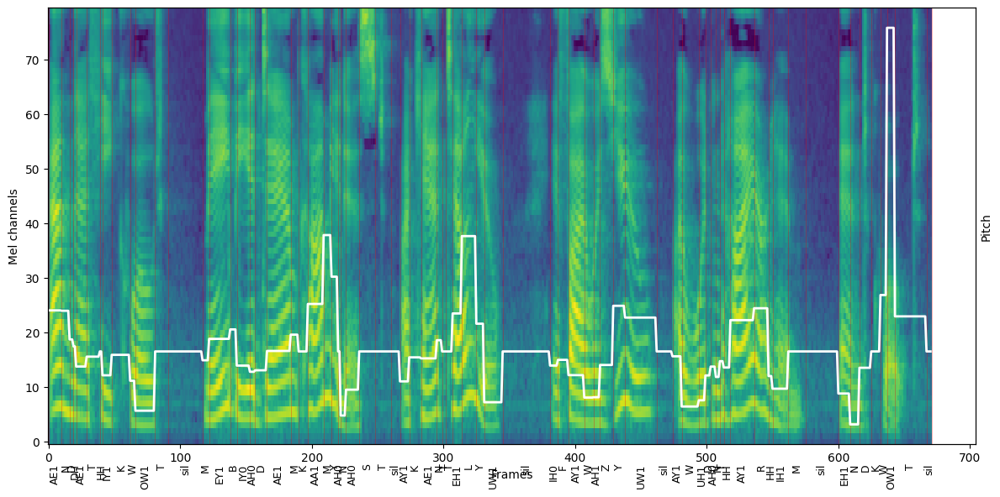

In [16]:
import numpy as np
from content.speech_course.week_08_tts_am_vocoders.sources.fastpitch.data import SymbolsSet

symbols_set = SymbolsSet()

sample_idx = 4
text_len = batch.text_lengths[sample_idx].item()
mel_len = batch.mel_lengths[sample_idx].item()

mel = batch.mels[sample_idx, :, :mel_len].cpu().numpy()
phone_durations = batch.durations[sample_idx, :text_len].cpu().numpy()
phone_pitch = batch.pitches[sample_idx, :text_len].cpu().numpy()
symbols = symbols_set.decode(batch.texts[sample_idx, :text_len].cpu().tolist())

frame_pitch = np.repeat(phone_pitch, phone_durations)

fig, ax = plt.subplots(figsize=(12, 6))
ax.imshow(mel, aspect='auto', origin='lower', interpolation='none')
ax.set_xlabel('Frames')
ax.set_ylabel('Mel channels')

ax2 = ax.twinx()
ax2.plot(frame_pitch, color='white', linewidth=2)
ax2.set_yticks([])
ax2.set_ylabel('Pitch')

bounds = np.concatenate([[0], np.cumsum(phone_durations)])
for i, sym in enumerate(symbols):
    center = (bounds[i] + bounds[i + 1]) / 2
    ax.text(center, -4, sym, ha='center', va='top', fontsize=9, rotation=90)
for b in bounds:
    ax.axvline(b, color='red', alpha=0.3, linewidth=0.7)

plt.tight_layout()
plt.show()

# 03. Implement FastPitch model (9 points)

Please implement the FastPitch model in the cell provided below. Running this cell will overwrite the model file in the repository.
- Run training (see next cells)
- Run inference (see next cells)
- When submitting the homework, please include
   - the Word Error Rate (WER) and loss curves obtained from TensorBoard as attachments,
   - the generated audio (see inference cells). If attaching an archive, use the name: `prediction.wav`

By the end of training, the loss should reach approximately 0.69, and WER should be close to zero (around 0.006). The training process will take about 30 minutes (3,000 batches).

**Important:** By the end of the training, the generated audio sample must be clear in terms of speech (WER close to 0) and maintain audio quality comparable to the original recordings (as logged in TensorBoard). **If these conditions are not met, the entire section will receive zero points**, regardless of how closely the model code resembles working code. Here is an example of how an audio from a well-trained model may sound:

In [17]:
audio, sr = sf.read('/content/speech_course/week_08_tts_am_vocoders/notebooks/prediction_example.wav')
Ipd.display(Ipd.Audio(audio, rate=sr))

In [18]:
%%writefile /content/speech_course/week_08_tts_am_vocoders/sources/fastpitch/model.py

import torch
from torch import nn as nn

from content.speech_course.week_08_tts_am_vocoders.sources.fastpitch.common.layers import TemporalPredictor
from content.speech_course.week_08_tts_am_vocoders.sources.fastpitch.common.utils import DeviceGetterMixin
from content.speech_course.week_08_tts_am_vocoders.sources.fastpitch.common.utils import regulate_len
from content.speech_course.week_08_tts_am_vocoders.sources.fastpitch.data import FastPitchBatch, SymbolsSet
from content.speech_course.week_08_tts_am_vocoders.sources.fastpitch.hparams import HParamsFastpitch
from content.speech_course.week_08_tts_am_vocoders.sources.fastpitch.common.transformer import FFTransformer


class FastPitch(nn.Module, DeviceGetterMixin):
    def __init__(self, hparams: HParamsFastpitch):
        super().__init__()
        self.hparams = hparams
        n_symbols = len(SymbolsSet().symbols_to_id)

        self.symbol_emb = nn.Embedding(n_symbols, hparams.symbols_embedding_dim)

        self.encoder = FFTransformer(
            n_layer=hparams.in_fft_n_layers,
            n_head=hparams.in_fft_n_heads,
            d_model=hparams.symbols_embedding_dim,
            d_head=hparams.in_fft_d_head,
            d_inner=4 * hparams.symbols_embedding_dim,
            kernel_size=hparams.in_fft_conv1d_kernel_size,
            dropout=hparams.p_in_fft_dropout,
            dropatt=hparams.p_in_fft_dropatt,
            dropemb=hparams.p_in_fft_dropemb
        )

        self.duration_predictor = TemporalPredictor(
            input_size=hparams.symbols_embedding_dim,
            filter_size=hparams.dur_predictor_filter_size,
            kernel_size=hparams.dur_predictor_kernel_size,
            dropout=hparams.p_dur_predictor_dropout,
            n_layers=hparams.dur_predictor_n_layers
        )

        self.pitch_predictor = TemporalPredictor(
            input_size=hparams.symbols_embedding_dim,
            filter_size=hparams.pitch_predictor_filter_size,
            kernel_size=hparams.pitch_predictor_kernel_size,
            dropout=hparams.p_pitch_predictor_dropout,
            n_layers=hparams.pitch_predictor_n_layers
        )

        self.pitch_emb = nn.Conv1d(1, hparams.symbols_embedding_dim, kernel_size=3, padding=1)

        self.decoder = FFTransformer(
            n_layer=hparams.out_fft_n_layers,
            n_head=hparams.out_fft_n_heads,
            d_model=hparams.symbols_embedding_dim,
            d_head=hparams.out_fft_d_head,
            d_inner=4 * hparams.symbols_embedding_dim,
            kernel_size=hparams.out_fft_conv1d_kernel_size,
            dropout=hparams.p_out_fft_dropout,
            dropatt=hparams.p_out_fft_dropatt,
            dropemb=hparams.p_out_fft_dropemb
        )

        self.proj = nn.Linear(hparams.symbols_embedding_dim, hparams.n_mel_channels, bias=True)

    def get_encoder_out(self, batch: FastPitchBatch):
        '''
        Return:
        enc_out:
            Output of the first series of FFT blocks (before adding pitch embedding)
            shape: (batch, len(text), symbols_embedding_dim)
        enc_mask:
            Boolean padding mask for the input text sequences
            shape: (batch, len(text), 1)
        '''
        text_emb = self.symbol_emb(batch.texts)
        enc_out, enc_mask = self.encoder(text_emb, batch.text_lengths)
        return enc_out, enc_mask

    def forward(self, batch: FastPitchBatch, use_gt_durations=True, use_gt_pitch=True, max_duration=75):
        '''
        Flags `use_gt_durations` and `use_gt_pitch` should be both True during training and either True or False during inference.

        Use the function `regulate_len` to duplicate phonemes according to durations before passing them to the decoder.

        Return:
        mel_out:
            Predicted mel-spectrograms
            shape: (batch, time, mel_bins)
        mel_lens:
            Number of time frames in each of the predicted spectrograms
            shape: (batch,)
        log_dur_pred:
            The predicted log-durations for each phoneme (the output of the duration predictor).
            shape: (batch, len(text))
        dur_pred:
            The exponent of the predicted log-durations for each phoneme. Clamped to the range (0, max_duration) for numeric stability
            shape: (batch, len(text))
        pitch_pred:
            The predicted pitch for each phoneme
            shape: (batch, len(text))
        '''
        enc_out, enc_mask = self.get_encoder_out(batch)

        log_dur_pred = self.duration_predictor(enc_out, enc_mask)
        dur_pred = torch.clamp(torch.exp(log_dur_pred) - 1, 0, max_duration)

        pitch_pred = self.pitch_predictor(enc_out, enc_mask)
        pitch_used = batch.pitches if use_gt_pitch else pitch_pred
        pitch_emb = self.pitch_emb(pitch_used.unsqueeze(1)).transpose(1, 2)
        enc_out = enc_out + pitch_emb

        dur_used = batch.durations if use_gt_durations else dur_pred
        len_regulated, dec_lens, _ = regulate_len(dur_used, enc_out)

        dec_out, _ = self.decoder(len_regulated, dec_lens)
        mel_out = self.proj(dec_out)

        return mel_out, dec_lens, dur_pred, log_dur_pred, pitch_pred
    @torch.no_grad()
    def infer(self, batch: FastPitchBatch, max_duration=75):
        enc_out, dur_pred, pitch_pred = self.infer_encoder(batch, max_duration=max_duration)
        mel_out, mel_lens = self.infer_decoder(enc_out, dur_pred)
        return mel_out, mel_lens, dur_pred, pitch_pred

    def infer_encoder(self, batch: FastPitchBatch, max_duration=75):
        enc_out, enc_mask = self.get_encoder_out(batch)

        log_dur_pred = self.duration_predictor(enc_out, enc_mask)
        dur_pred = torch.clamp(torch.exp(log_dur_pred) - 1, 0, max_duration)

        pitch_pred = self.pitch_predictor(enc_out, enc_mask)
        pitch_emb = self.pitch_emb(pitch_pred.unsqueeze(1)).transpose(1, 2)
        enc_out = enc_out + pitch_emb

        return enc_out, dur_pred, pitch_pred

    def infer_decoder(self, enc_out, dur_pred):
        len_regulated, dec_lens, _ = regulate_len(dur_pred, enc_out)
        dec_out, _ = self.decoder(len_regulated, dec_lens)
        mel_out = self.proj(dec_out)
        return mel_out, dec_lens


Overwriting /content/speech_course/week_08_tts_am_vocoders/sources/fastpitch/model.py


In [20]:
 # Allows reloading code import without kernel restart

import sys
import types

if 'imp' not in sys.modules: # face imp as new python do not have it
    import importlib
    imp_mock = types.ModuleType('imp')
    imp_mock.reload = importlib.reload
    sys.modules['imp'] = imp_mock

%load_ext autoreload
%autoreload 2

In [21]:
from content.speech_course.week_08_tts_am_vocoders.sources.fastpitch.model import FastPitch

In [22]:
fp = FastPitch(hparams)

In [23]:
enc_out, enc_mask = fp.get_encoder_out(batch)

In [24]:
assert enc_out.shape == torch.Size([hparams.batch_size, batch.texts.shape[1], hparams.symbols_embedding_dim])
assert enc_mask.shape == torch.Size([hparams.batch_size, batch.texts.shape[1], 1])

In [25]:
mel_out, mel_lens, dur_pred, log_dur_pred, pitch_pred = fp.forward(batch)

In [26]:
assert mel_out.shape == batch.mels.transpose(2, 1).shape
assert mel_lens.shape == batch.mel_lengths.shape
assert dur_pred.shape == batch.texts.shape
assert dur_pred.shape == log_dur_pred.shape
assert pitch_pred.shape == batch.texts.shape

### Run training

In [27]:
logs_dir = "logs"     # Choose any paths
ckpt_dir = "checkpoints"

In [28]:
os.makedirs(logs_dir, exist_ok=True)
os.makedirs(ckpt_dir, exist_ok=True)

In [33]:
import subprocess as sp
import sys

# gpu 0 is correct one! not default "1"
# + some correction in whisper.py file in common/, due to new API in transformers library
# and changing paths inside all files of fastpitch due to incorrected path installation of git

cmd_str = ' '.join([
    f'PYTHONPATH={path_to_sources} CUDA_VISIBLE_DEVICES={gpu_avaiable}',
    f'python3 -m content.speech_course.week_08_tts_am_vocoders.sources.fastpitch.train_fastpitch',
    f'--logs {logs_dir}',
    f'--ckptdir {ckpt_dir}',
    f'--dataset {path_to_dataset}',
    f'--hfg {path_to_hfg_ckpt}'
])

result = sp.run(cmd_str, shell=True, capture_output=True, text=True)

if result.returncode != 0:
    print("--- STDOUT LOGS ---")
    print(result.stdout)
    print("\n--- CRITICAL ERROR TRACEBACK (STDERR) ---", file=sys.stderr)
    print(result.stderr, file=sys.stderr)
else:
    print("Training finished successfully!")

Training finished successfully!


In [35]:
# If running in colab:

%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 67783), started 0:00:09 ago. (Use '!kill 67783' to kill it.)

<IPython.core.display.Javascript object>

In [50]:
# If running in colab:

%%shell

# mkdir logs checkpoints

# some problem encountered here too with 08 week being written as 07
PYTHONPATH=/:/content/speech_course python3 -m week_08_tts_am_vocoders.sources.fastpitch.train_fastpitch  \
  --logs logs \
  --ckptdir checkpoints \
  --dataset /content/ljspeech_aligned \
  --hfg /content/hifigan_gen_checkpoint_6500.pt

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()
69529 29 01:14:23 INFO Loaded checkpoints/fp_step_00003000.pt
/usr/local/lib/python3.12/dist-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)
HiFi-GAN: Removing weight norm.
69529 29 01:14:24 INFO Epoch num: 2
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested m

### Infer model on an example

Execute the code provided below. Then, append the generated audio to the homework results.
- if attaching an archive, use name: `prediction.wav`

In [51]:
from content.speech_course.week_08_tts_am_vocoders.sources.fastpitch.common.checkpointer import Checkpointer
from content.speech_course.week_08_tts_am_vocoders.sources.fastpitch.model import FastPitch
from content.speech_course.week_08_tts_am_vocoders.sources.fastpitch.data import FastPitchBatch, SymbolsSet
from content.speech_course.week_08_tts_am_vocoders.sources.hifigan.model import load_model as load_hfg_model

In [52]:
def get_symbol_ids(text):
    g2p = G2p()
    phonemes = g2p(text)

    symbols_set = SymbolsSet()

    symbols = []
    for ph in phonemes:
        if ph in symbols_set.symbols_to_id:
            symbols.append(ph)
        elif ph == ' ':
            continue
        else:
            symbols.append("sil")

    symbols_ids = torch.LongTensor(symbols_set.encode(symbols))
    text_length = torch.LongTensor([symbols_ids.shape[0]])

    return symbols_ids, text_length

In [53]:
checkpointer = Checkpointer(ckpt_dir)

In [54]:
hfg = load_hfg_model(path_to_hfg_ckpt)
hfg = hfg.to(device).eval()

/usr/local/lib/python3.12/dist-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


HiFi-GAN: Removing weight norm.


In [55]:
ckpt_dict = checkpointer.load_last_checkpoint()
hparams = HParamsFastpitch.create(ckpt_dict['hparams'])
fp = FastPitch(hparams)
fp.load_state_dict(ckpt_dict['state_dict'])
fp = fp.to(device)

In [75]:
text = "Rest in peace granny, My granny hit by a bazooka, kaboom, kablauw, I was in my room with my little sister trying to teach her! thne kaboom granny is gone."

In [76]:
import nltk
nltk.download('averaged_perceptron_tagger_eng')

# Now your original code will run smoothly:
symbols_ids, lengths = get_symbol_ids(text)

batch = FastPitchBatch(
    texts=symbols_ids.unsqueeze(0),
    text_lengths=lengths
).to(device)

[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


In [77]:
with torch.no_grad():
    mels, mel_lens, *_ = fp.infer(batch)
    mels = mels.permute(0, 2, 1)
    audio = hfg(mels)

Ipd.display(Ipd.Audio(audio.squeeze().cpu().detach().numpy(), rate=22050))

### Pitch & duration manipulations (1 point)

- **(0.5 points)** Try increasing and decreasing the prediction speed by a factor of 2, draw spectrograms for each case
    - if attaching an archive, use names:  `prediction_half_dur.wav`,  `prediction_double_dur.wav`
- **(0.5 points)** Try shifting prediction pitch 50 Hz up and down, draw spectrograms for each case
    - if attaching an archive, use names:  `prediction_50hz_up.wav`,  `prediction_50hz_down.wav`

Аttach resulting audio files to the homework report.

In [78]:
def scale_durations(durations: torch.Tensor, scale_factor: float):
    return torch.round(durations * scale_factor).long()


def shift_pitch(pitch: torch.Tensor, shift: float):
    scale = 62.51305    # Mean and variance of pitch in LJSpeech used for target pitch normalization
    mean = 215.42230
    return pitch + shift / scale

In [79]:
_, dur_pred, pitch_pred = fp.infer_encoder(batch)

In [80]:
batch = FastPitchBatch(
    texts=symbols_ids.unsqueeze(0),
    text_lengths=lengths,
    pitches=shift_pitch(pitch_pred, shift=0),
    durations=scale_durations(dur_pred, scale_factor=2)
).to(device)

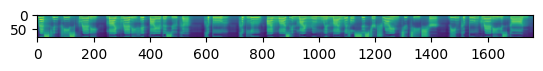

In [81]:
with torch.no_grad():
    mels, mel_lens, *_ = fp(batch, use_gt_durations=True, use_gt_pitch=True)
    mels = mels.permute(0, 2, 1)
    audio = hfg(mels)

Ipd.display(Ipd.Audio(audio.squeeze().cpu().detach().numpy(), rate=22050))
plt.imshow(mels.squeeze().cpu().detach().numpy())
plt.show()